# DDPLKO Moduł 8 - praca domowa - Analiza działania modelu

To ósma praca domowa w Programie szkoleniowym Klasyfikacja obrazu od Deep Drive PL

Twoim zadaniem w tym module będzie - w zależności od dostępnej mocy obliczniowej:
1. Na bazie pracy domowej z Transfer learningiem, data augmentation
2. Na bazie pracy domowej ze zbiorem **QuickDraw**

Wykonanie dla próbek w których model się pomylił podczas predykcji:
- [ ] Wizualizacji Occlusion sensitivy
- [ ] oraz GradCAM/Guided GradCAM
- [ ] Udostępnij przykładowy wynik na Discordzie `#klasyfikacja-wyniki` (wystarczy dla 1 zdjęcia)

Możesz extra (czyli opcjonalne rzeczy):
- Zwizualizować zbiór Val wykorzystując t-SNE/UMAP/MDE

# Sourcing data

In [ ]:
from PIL import Image
from datetime import datetime
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from torch.utils.tensorboard import SummaryWriter
from torch.utils import tensorboard
from torch.utils.data import Dataset
from torch.utils.data import TensorDataset, DataLoader
from torchsummary import summary
from torchvision import datasets, transforms
from tqdm.notebook import tqdm
import torch.optim as optim

import glob
import matplotlib.pyplot as plt
import numpy as np
import progressbar
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
import urllib.request
import zipfile

sns.set(style='white', font_scale=1.5)
pbar = None

def show_progress(block_num, block_size, total_size):
    global pbar
    if pbar is None:
        pbar = progressbar.ProgressBar(maxval=total_size)
        pbar.start()

    downloaded = block_num * block_size
    if downloaded < total_size:
        pbar.update(downloaded)
    else:
        pbar.finish()
        pbar = None

if 'dataset.7z' not in glob.glob('*'):
  urllib.request.urlretrieve('https://dataverse.nl/api/access/datafile/14166?format=original&gbrecs=true', 'dataset.7z', show_progress)

if 'dataset' not in glob.glob("*"):
  !7z e dataset.7z

if 'Wild_Anim_Dataset' not in glob.glob("*"):
  !unzip Wild_Anim_Dataset.zip
if 'dataset' not in glob.glob("*"):
  !unzip Wild_Anim_Dataset/Wild_Anim_Dataset.zip
if 'dataset' not in glob.glob("*"):
  !mv Wild_Anim_Dataset/Wild_Anim_5000_images dataset

In [2]:
import numpy as np
from skimage.transform import resize

class_names = [i.replace('dataset/', '') for i in glob.glob("dataset/*")]
data = []
X = np.zeros((5000, 3, 150, 150))
for i, name in enumerate(class_names):
    images = glob.glob('dataset/' + name + '/*')
    for j, file in enumerate(images):
        img = np.asarray(Image.open(file))
        if img.shape != (150, 150, 3):
            img = resize(img, (150, 150)) * 255
        img = img.transpose((2, 0, 1)) / 255
        X[i * 1000 + j] = img

y = np.concatenate([np.array([i] * 1000) for i in range(len(class_names))],
                   axis=0)


In [3]:
%load_ext tensorboard

unique_name=datetime.now().strftime("%Y_%m_%d-%H_%M_%S")
writer = tensorboard.SummaryWriter('./logs/pt/'+unique_name)

use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")

In [4]:
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.3,
                                                    random_state=1)


In [5]:
batch_size = 64
train_loader = DataLoader(TensorDataset(torch.Tensor(X_train), torch.Tensor(y_train)), batch_size=batch_size)
val_loader = DataLoader(TensorDataset(torch.Tensor(X_test), torch.Tensor(y_test)), batch_size=batch_size)

# Tensorboard

In [44]:
%tensorboard --logdir logs/pt

Reusing TensorBoard on port 6006 (pid 150), started 0:17:49 ago. (Use '!kill 150' to kill it.)

<IPython.core.display.Javascript object>

# Model creation + training

In [7]:
!pip install timm
import timm

     |████████████████████████████████| 431 kB 5.0 MB/s 


In [8]:
def train_model(model,
                optimizer,
                scheduler,
                train_loader,
                val_loader,
                epochs,
                batch_size,
                step_each_batch=False):
    train_losses = []
    val_losses = []
    train_accs = []
    val_accs = []

    for epoch in tqdm(list(range(1, epochs + 1))):
        logs = {}
        model.train()
        train_loss = 0
        correct = 0
        for batch_idx, (data, target) in enumerate(tqdm(train_loader)):
            target = target.type(torch.LongTensor)
            data, target = data.to(device), target.to(device)
            optimizer.zero_grad()
            output = model(data)
            loss = nn.CrossEntropyLoss()(output, target)
            loss.backward()
            optimizer.step()
            if step_each_batch:
                scheduler.step()

            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().detach()
            train_loss += loss.detach()

        if not step_each_batch:
            scheduler.step()
        train_loss /= len(train_loader)
        acc = correct / float(len(train_loader.dataset))
        train_losses.append(train_loss)
        train_accs.append(acc)

        model.eval()
        val_loss = 0
        correct = 0
        with torch.no_grad():
            for data, target in val_loader:
                target = target.type(torch.LongTensor)
                data, target = data.to(device), target.to(device)
                output = model(data)
                val_loss += nn.CrossEntropyLoss()(output, target).item(
                )  #, reduction='sum').detach()  # sum up batch loss
                pred = output.argmax(dim=1, keepdim=True)
                correct += pred.eq(target.view_as(pred)).sum().detach()

        val_loss /= len(val_loader.dataset)
        val_acc = correct / float(len(val_loader.dataset))
        val_losses.append(val_loss)
        val_accs.append(val_acc)

        writer.add_scalar('Loss/train', train_loss, epoch)
        writer.add_scalar('Loss/test', val_loss, epoch)
        writer.add_scalar('Accuracy/train', acc, epoch)
        writer.add_scalar('Accuracy/test', val_acc, epoch)

    return train_losses, val_losses, train_accs, val_accs


In [ ]:
unique_name = datetime.now().strftime("%Y_%m_%d-%H_%M_%S")
writer = tensorboard.SummaryWriter('./logs/pt/' + unique_name)
mnasnet = timm.create_model('mnasnet_small',
                            pretrained=True,
                            num_classes=len(class_names))

epochs = 100
learning_rate = 4e-4
model = mnasnet.to(device)

total = len([1 for _ in model.parameters()])
for i, param in enumerate(model.parameters()):
    if i >= (total - 2):
        param.requires_grad = True
    else:
        param.requires_grad = False

summary(model.cuda(), (3, 150, 150))


In [ ]:
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                            step_size=100,
                                            gamma=0.1)
train_losses, val_losses, train_accs, val_accs = train_model(
    model, optimizer, scheduler, train_loader, val_loader, epochs, batch_size)


# Evaluating model

In [39]:
from PIL import Image
import cv2

model.eval()

transform = transforms.Compose([transforms.ToTensor()])

files = ['lio.png', 'leo.png', 'ele.png', 'wolf.png', 'bear.png']
targets = [class_names.index('Lion'),\
           class_names.index('Leopard'),\
           class_names.index('Elephant'),\
           class_names.index('Wolf'),\
           class_names.index('Bear')]
images = []

for file in files:
    img = cv2.imread(file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (150, 150))
    images.append(np.asarray(img) / 255)


In [40]:
batches = [
    transform(image).unsqueeze(0).to(device=device, dtype=torch.float)
    for image in images
]


In [41]:
outputs = []
for batch in batches:
    outputs.append(model(batch))


In [42]:
for name, output in zip(files, outputs):
    print(name)
    top5_prob, top5_catid = torch.topk(F.softmax(output[0]), 5)

    for i in range(top5_prob.size(0)):
        print(top5_catid[i].cpu().detach().numpy(), class_names[top5_catid[i]],
              f'{top5_prob[i].item()*100:.2f}', "%")


lio.png
3 Lion 99.01 %
1 Elephant 0.73 %
4 Bear 0.17 %
2 Wolf 0.08 %
0 Leopard 0.00 %
leo.png
0 Leopard 100.00 %
4 Bear 0.00 %
2 Wolf 0.00 %
3 Lion 0.00 %
1 Elephant 0.00 %
ele.png
1 Elephant 98.38 %
0 Leopard 1.58 %
4 Bear 0.03 %
2 Wolf 0.01 %
3 Lion 0.00 %
wolf.png
2 Wolf 92.91 %
0 Leopard 6.99 %
4 Bear 0.06 %
3 Lion 0.03 %
1 Elephant 0.00 %
bear.png
4 Bear 99.87 %
2 Wolf 0.12 %
0 Leopard 0.01 %
1 Elephant 0.00 %
3 Lion 0.00 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  This is separate from the ipykernel package so we can avoid doing imports until


# Occlusion sensitivity

In [35]:
!pip install captum

     |████████████████████████████████| 1.4 MB 5.3 MB/s 


In [36]:
from captum.attr import Occlusion, GuidedGradCam
from captum.attr import visualization as viz

In [37]:
strides = (1, 10, 10)
sliding_window_shape = (1, 15, 15)
baselines = 0

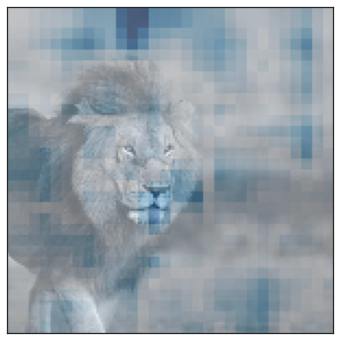

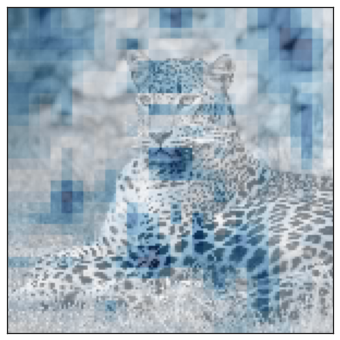

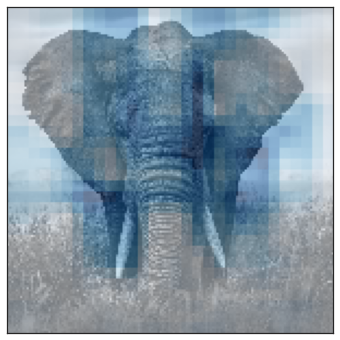

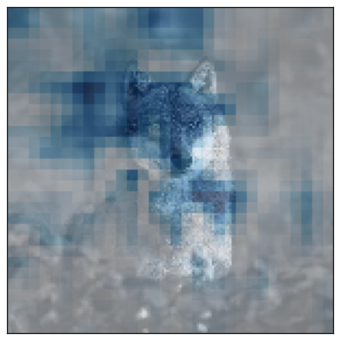

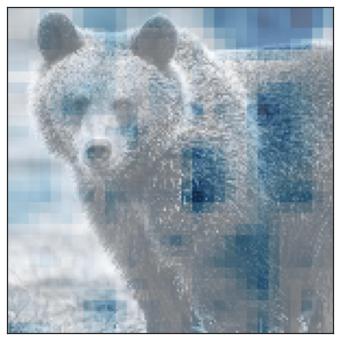

In [43]:
for target, img, batch in zip(targets,images,batches):
  occlusion = Occlusion(model)
  attributions = occlusion.attribute(batch, strides=strides,
                                   target=target, sliding_window_shapes=sliding_window_shape,
                                   baselines=baselines, show_progress=False)
  attributions = np.transpose(attributions.squeeze().cpu().detach().numpy(), (1,2,0))
  viz.visualize_image_attr(attributions, img, 'blended_heat_map')

# (Guided) GradCAM

In [45]:
for i in model.modules():
    if type(i) == torch.nn.modules.activation.ReLU:
        i.inplace = False


In [46]:
methods = {
    'methods': [
        'original_image', 'heat_map', 'blended_heat_map', 'masked_image',
        'alpha_scaling'
    ]
}
signs_positive = {
    'signs': ['all', 'positive', 'positive', 'positive', 'positive']
}  #positive pixel attributions
titles = ['Heatmap', 'Blended heatmap', 'Masked image', 'Alpha scaling']
plot_kwargs = {'show_colorbar': True, 'fig_size': (30, 10)}


/usr/local/lib/python3.7/dist-packages/captum/_utils/gradient.py:59: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  "required_grads has been set automatically." % index
/usr/local/lib/python3.7/dist-packages/captum/attr/_core/guided_backprop_deconvnet.py:65: UserWarning: Setting backward hooks on ReLU activations.The hooks will be removed after the attribution is finished
  "Setting backward hooks on ReLU activations."


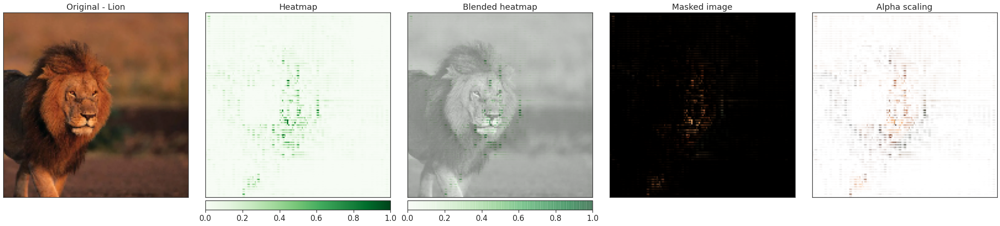

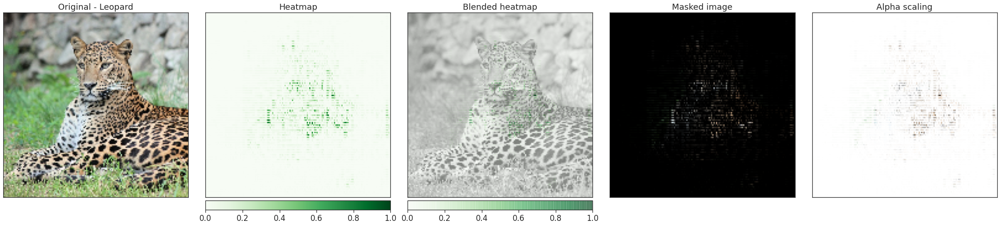

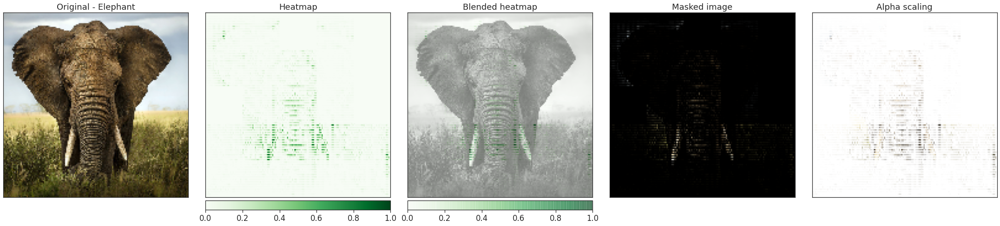

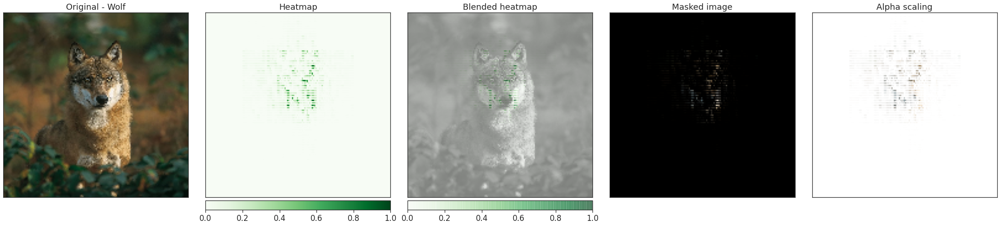

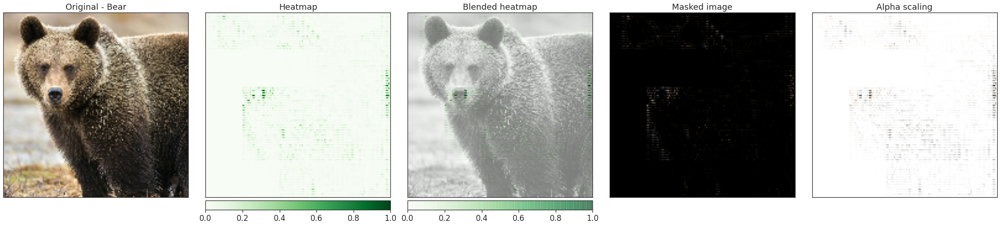

In [47]:
from captum.attr._utils.attribution import LayerAttribution
for target, img, batch in zip(targets, images, batches):
    guided_gradcam = GuidedGradCam(model, model.blocks[6][0].bn3)
    attributions = guided_gradcam.attribute(batch, target=target)
    attributions = LayerAttribution.interpolate(attributions,
                                                (img.shape[0], img.shape[1]))
    attributions = np.transpose(
        attributions.squeeze(0).cpu().detach().numpy(), (1, 2, 0))
    viz.visualize_image_attr_multiple(
        attributions,
        img,
        **methods,
        **signs_positive,
        **plot_kwargs,
        titles=['Original - ' + class_names[target], *titles])


# GPUMAP taki UMAP, tylko, że na GPU

In [12]:
!pip install umap-learn --quiet
import umap.umap_ as umap
!pip install git+https://github.com/p3732/gpumap --quiet

     |████████████████████████████████| 86 kB 2.9 MB/s 
     |████████████████████████████████| 1.1 MB 9.9 MB/s 
     |████████████████████████████████| 4.7 MB 5.0 MB/s 


In [14]:
!pip install scikit-learn numba faiss gpumap --quiet
!pip install faiss-gpu --quiet
import gpumap

In [15]:
activation = {}


def get_activation(name):

    def hook(model, input, output):
        if name in activation:
            activation[name] = np.concatenate(
                (activation[name], output.detach().cpu().numpy()))
        else:
            activation[name] = output.detach().cpu().numpy()

    return hook

In [16]:
handle = model.global_pool.register_forward_hook(get_activation('global_pool'))

In [17]:
with torch.no_grad():
    for img, target in train_loader:
        img = img.to(device)
        output = model(img)


In [18]:
handle.remove()

In [19]:
activation['global_pool'].shape

(3500, 1280)

In [20]:
um = activation['global_pool']

In [ ]:
embedding = gpumap.GPUMAP().fit_transform(um)

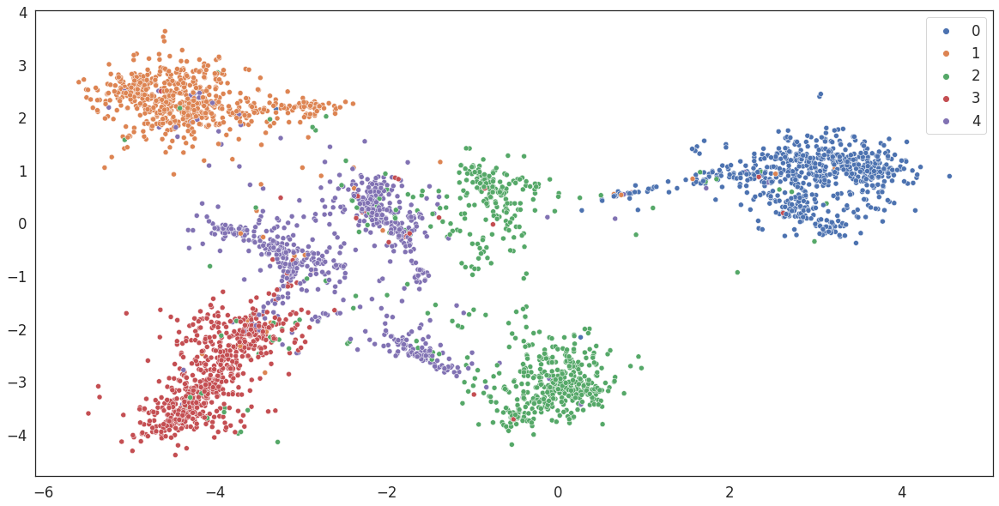

In [22]:
plt.figure(figsize=(20, 10))
sns.scatterplot(x=embedding[:, 0],
                y=embedding[:, 1],
                hue=y_train,
                palette=sns.color_palette()[:5])


# UMAP

In [23]:
umap_results = umap.UMAP(verbose=True).fit_transform(um)

UMAP( verbose=True)
Mon Apr 11 10:02:38 2022 Construct fuzzy simplicial set
Mon Apr 11 10:02:46 2022 Finding Nearest Neighbors
Mon Apr 11 10:02:50 2022 Finished Nearest Neighbor Search
Mon Apr 11 10:02:53 2022 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Mon Apr 11 10:03:05 2022 Finished embedding


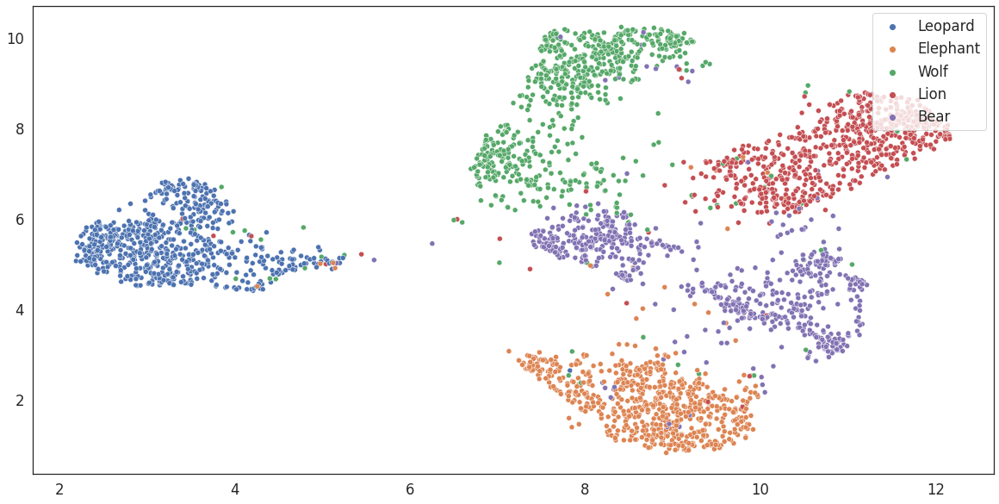

In [24]:
plt.figure(figsize=(20, 10))
ax = sns.scatterplot(x=umap_results[:, 0],
                     y=umap_results[:, 1],
                     hue=y_train,
                     palette=sns.color_palette()[:5])
handles, labels = ax.get_legend_handles_labels()

ax.legend(handles, class_names, loc='upper right')

In [25]:
from sklearn.manifold import TSNE

X_embedded = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(um)

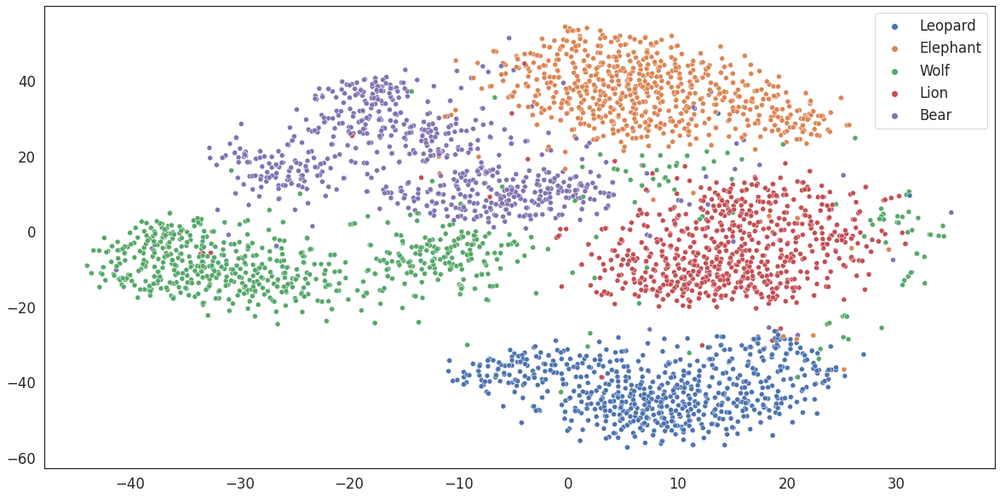

In [30]:
plt.figure(figsize=(20, 10))
ax = sns.scatterplot(x=X_embedded[:, 0],
                     y=X_embedded[:, 1],
                     hue=y_train,
                     palette=sns.color_palette()[:5])
handles, labels = ax.get_legend_handles_labels()

ax.legend(handles, class_names, loc='upper right')

In [27]:
umap_results[:, 1].shape


(3500,)

# MDE

In [ ]:
!pip install pymde
import pymde

Apr 11 10:03:46 AM: Computing 15-nearest neighbors, with max_distance=None
Apr 11 10:03:46 AM: Exact nearest neighbors by brute force 
Apr 11 10:03:47 AM: Computing quadratic initialization.


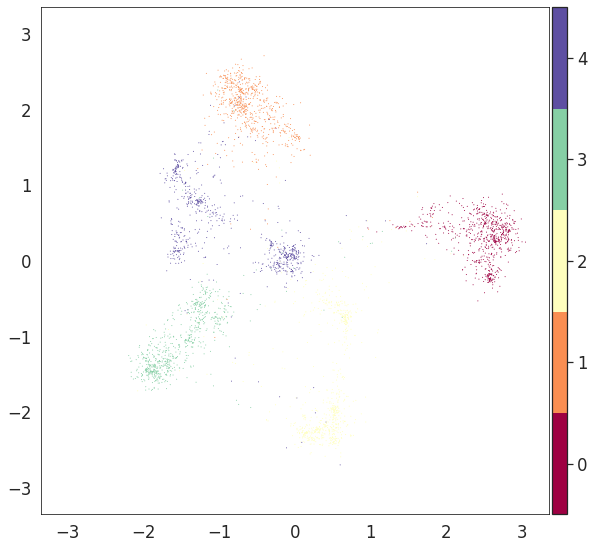

In [29]:
embedding = pymde.preserve_neighbors(um, verbose=True).embed()
pymde.plot(embedding, color_by=y_train)

# Summary / extra

### Próbowałem napisać autoenkoder do redukcji wymiarów do dwóch punktów x,y, jednak nie osiągnąłem zadowalających efektów.

# Wyślij rozwiązanie
Możesz skorzystać z jednego z poniższych sposobów:
**mailem na specjalny adres** ze strony pracy domowej w panelu programu prześlij jedno z poniższych:
- notebooka (jeżeli plik ma mniej niż np. 10MB)
- notebooka w zipie
- link do Colaba (udostępniony)
- link do pliku przez GDrive/Dropboxa/WeTransfer/...
- pdfa (poprzez download as pdf)
- jako plik w repozytorium na np. GitHubie, by budować swoje portfolio (wtedy uważaj na wielkość pliku, najlepiej kilka MB, Max 25MB)

Najlepiej, by w notebooku było widać wyniki uruchomienia komórek, chyba, że przez nie plik będzie mieć 100+MB wtedy najlepiej Colab lub jakieś przemyślenie co poszło nie tak (zbyt dużo dużych zdjęć wyświetlonych w komórkach).

## Co otrzymasz?
Informację zwrotną z ewentualnymi sugestiami, komentarzami.